<a href="https://www.kaggle.com/code/arihantdebnath/distracted-driver-svm-pca?scriptVersionId=204869984" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# ML Project
## Classification of Distracted Drivers Using Support Vector Machine Based on Principal Component Analysis Feature Reduction and Convolutional Neural Networks

Paper: https://ejurnal.undana.ac.id/index.php/jicon/article/view/12658 <br>
Dataset: https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/data <br>
Code: https://www.kaggle.com/code/achmadyunedaalfajr/skripsi-05-22-2023-svm-pca-scrath-cnn-lib-v4 <br>

In [1]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [2]:
# Import dataset
state_farm_distracted_driver_detection_path = kagglehub.competition_download('state-farm-distracted-driver-detection')

print('Data source import complete.')


Data source import complete.


In [3]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import itertools
import pandas as pd
import glob
import pickle
import os
import time
from keras.models import Sequential, save_model
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from sklearn.utils import check_random_state
from tqdm import tqdm

In [4]:
main_path = '/kaggle/input/state-farm-distracted-driver-detection/imgs/train/c'
class_labels = []
images = []

# Melakukan iterasi untuk setiap kelas
for class_index in range(10):
    class_path = main_path + str(class_index)  # Path ke direktori kelas saat ini
    for root, dirs, files in os.walk(class_path):
        # Memproses file-file pada kelas saat ini
        for filename in tqdm(files, desc='Memproses kelas ' + str(class_index)):
            image_path = os.path.join(class_path, filename)
            img = cv2.imread(image_path)
            img = cv2.resize(img, (100, 100)) / 255
            images.append(img)
            class_labels.append(class_index)

Memproses kelas 9: 100%|██████████| 2129/2129 [00:13<00:00, 160.85it/s]


In [5]:
train_images, test_images, train_labels, test_labels = train_test_split(np.array(images), np.array(class_labels), test_size = 0.2, shuffle=True)

In [6]:
# Define the custom CNN architecture
cnn = Sequential()
cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(64, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Conv2D(128, (3, 3), activation='relu'))
cnn.add(MaxPooling2D((2, 2)))
cnn.add(Flatten())
cnn.add(Dense(256, activation='relu'))
cnn.add(Dense(128, activation='relu'))
cnn.add(Dense(10, activation='softmax'))

# Compile the model
cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [7]:
cnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │         1,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,404,490 (12.99 MB)

 Trainable params: 3,404,490 (12.99 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
# Encode the target labels as one-hot vectors
train_labels_encoded = to_categorical(train_labels, num_classes=10)
test_labels_encoded = to_categorical(test_labels, num_classes=10)

cnn.fit(train_images, train_labels_encoded, epochs=10, batch_size=32, validation_data=(test_images, test_labels_encoded))

Epoch 1/10


I0000 00:00:1730566722.053917      97 service.cc:145] XLA service 0x7a1b8c0026f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1730566722.053973      97 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


 22/561 ━━━━━━━━━━━━━━━━━━━━ 4s 7ms/step - accuracy: 0.1140 - loss: 2.3060

I0000 00:00:1730566725.028546      97 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


561/561 ━━━━━━━━━━━━━━━━━━━━ 14s 17ms/step - accuracy: 0.5802 - loss: 1.1596 - val_accuracy: 0.9708 - val_loss: 0.1160
Epoch 2/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.9793 - loss: 0.0720 - val_accuracy: 0.9788 - val_loss: 0.0776
Epoch 3/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9900 - loss: 0.0330 - val_accuracy: 0.9824 - val_loss: 0.0658
Epoch 4/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9927 - loss: 0.0256 - val_accuracy: 0.9757 - val_loss: 0.0934
Epoch 5/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9915 - loss: 0.0284 - val_accuracy: 0.9900 - val_loss: 0.0352
Epoch 6/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9952 - loss: 0.0178 - val_accuracy: 0.9739 - val_loss: 0.1077
Epoch 7/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9943 - loss: 0.0186 - val_accuracy: 0.9884 - val_loss: 0.0445
Epoch 8/10
561/561 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.9967 - loss: 0.0102 - val_accuracy: 0.9868 - va

In [9]:
# Remove the last layer from the CNN model
cnn = Sequential(cnn.layers[:-1])

# Preventing the weights from being updated
for layer in cnn.layers:
    layer.trainable = False

In [10]:
cnn.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 98, 98, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 23, 23, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 21, 21, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 10, 10, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     3,277,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,403,200 (12.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 3,403,200 (12.98 MB)

In [11]:
train_features = cnn.predict(train_images)
test_features = cnn.predict(test_images)

561/561 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
141/141 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [12]:
print(train_features.shape)
print(test_features.shape)

(17939, 128)
(4485, 128)


In [13]:
class PCA:
    def __init__(self, n_components):
        self.n_components = n_components
        self.components = None
        self.mean = None

    def fit(self, X):
        # Calculate the mean of each feature
        self.mean = np.mean(X, axis=0)

        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Calculate the covariance matrix
        cov = np.cov(X.T)

        # Calculate the eigenvalues and eigenvectors of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eig(cov)

        # Sort the eigenvectors by their corresponding eigenvalues in descending order
        eigenvectors = eigenvectors.T
        idxs = np.argsort(eigenvalues)[::-1]
        eigenvectors = eigenvectors[idxs]
        eigenvalues = eigenvalues[idxs]

        # Store the first n_components eigenvectors as the components
        self.components = eigenvectors[0:self.n_components]

    def transform(self, X):
        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Project the data onto the components
        return np.dot(X, self.components.T)

    def fit_transform(self, X):
        # Calculate the mean of each feature
        self.mean = np.mean(X, axis=0)

        # Center the data by subtracting the mean from each feature
        X = X - self.mean

        # Calculate the covariance matrix
        cov = np.cov(X.T)

        # Calculate the eigenvalues and eigenvectors of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eig(cov)

        # Sort the eigenvectors by their corresponding eigenvalues in descending order
        eigenvectors = eigenvectors.T
        idxs = np.argsort(eigenvalues)[::-1]
        eigenvectors = eigenvectors[idxs]
        eigenvalues = eigenvalues[idxs]

        # Store the first n_components eigenvectors as the components
        self.components = eigenvectors[0:self.n_components]

        # Project the data onto the components
        return np.dot(X, self.components.T)

In [14]:
# Create a PCA object with 16 components
pca = PCA(n_components=16)
train_features_reduced = pca.fit_transform(train_features)
test_features_reduced = pca.transform(test_features)

In [15]:
print(train_features_reduced.shape)
print(test_features_reduced.shape)

(17939, 16)
(4485, 16)


In [16]:
train_features_reduced_save = pd.DataFrame(train_features_reduced)
train_features_reduced_save.to_csv('train_features_reduced_save.csv', index=False)

In [17]:
test_features_reduced_save = pd.DataFrame(test_features_reduced)
test_features_reduced_save.to_csv('test_features_reduced_save.csv', index=False)

In [18]:
train_tar_save = pd.DataFrame(train_labels)
train_tar_save.to_csv('train_tar.csv', index=False)

In [19]:
test_tar_save = pd.DataFrame(test_labels)
test_tar_save.to_csv('test_tar.csv', index=False)

In [20]:
print(train_features_reduced[0])

[  8.58555085 -12.34823799  -1.78249485   1.21368862  -1.45595946
  10.79480044   1.74263081   2.06326393  -4.94691474   3.24119932
  -2.2752922    0.78145206   1.40062222   1.43478083  -0.33851532
  -3.78616968]


In [21]:
print(test_features_reduced[0])

[-13.8738864   11.62156336 -12.85668396   3.76110852  -8.02387486
   1.11141302   4.88623192   2.37030145  -7.07098803  -4.73026772
   1.43579777   0.51056808   0.06489201  -2.68473181   2.72091216
  -1.73524569]


In [22]:
class SVM:
    def __init__(self, C=1, max_iter=50, tol=0.05,
                 random_state=None, verbose=0):
        self.C = C
        self.max_iter = max_iter
        self.tol = tol,
        self.random_state = random_state
        self.verbose = verbose

    def projection_simplex(self, v, z=1):
        n_features = v.shape[0]
        u = np.sort(v)[::-1]
        cssv = np.cumsum(u) - z
        ind = np.arange(n_features) + 1
        cond = u - cssv / ind > 0
        rho = ind[cond][-1]
        theta = cssv[cond][-1] / float(rho)
        w = np.maximum(v - theta, 0)
        return w

    def _partial_gradient(self, X, y, i):
        # Partial gradient for the ith sample.
        g = np.dot(X[i], self.coef_.T) + 1
        g[y[i]] -= 1
        return g

    def _violation(self, g, y, i):
        # Optimality violation for the ith sample.
        smallest = np.inf
        for k in range(g.shape[0]):
            if k == y[i] and self.dual_coef_[k, i] >= self.C:
                continue
            elif k != y[i] and self.dual_coef_[k, i] >= 0:
                continue

            smallest = min(smallest, g[k])

        return g.max() - smallest

    def _solve_subproblem(self, g, y, norms, i):
        # Prepare inputs to the projection.
        Ci = np.zeros(g.shape[0])
        Ci[y[i]] = self.C
        beta_hat = norms[i] * (Ci - self.dual_coef_[:, i]) + g / norms[i]
        z = self.C * norms[i]

        # Compute projection onto the simplex.
        beta = self.projection_simplex(beta_hat, z)

        return Ci - self.dual_coef_[:, i] - beta / norms[i]

    def fit(self, X, y):
        n_samples, n_features = X.shape

        n_classes = np.unique(y).size
        self.dual_coef_ = np.zeros((n_classes, n_samples), dtype=np.float64)
        self.coef_ = np.zeros((n_classes, n_features))

        # Pre-compute norms.
        norms = np.sqrt(np.sum(X ** 2, axis=1))

        # Shuffle sample indices.
        rs = check_random_state(self.random_state)
        ind = np.arange(n_samples)
        rs.shuffle(ind)

        violation_init = None
        for it in range(self.max_iter):
            violation_sum = 0

            for ii in range(n_samples):
                i = ind[ii]

                # All-zero samples can be safely ignored.
                if norms[i] == 0:
                    continue

                g = self._partial_gradient(X, y, i)
                v = self._violation(g, y, i)
                violation_sum += v

                if v < 1e-12:
                    continue

                # Solve subproblem for the ith sample.
                delta = self._solve_subproblem(g, y, norms, i)

                # Update primal and dual coefficients.
                self.coef_ = self.coef_.astype(np.complex128)
                self.dual_coef_ = self.dual_coef_.astype(np.complex128)
                delta = delta.astype(np.complex128)

                self.coef_ += np.multiply(delta[:, np.newaxis], X[i][:, np.newaxis].conj().T)
                self.dual_coef_[:, i] += delta

            if it == 0:
                violation_init = violation_sum

            vratio = violation_sum / violation_init

            if vratio < self.tol:
                if self.verbose >= 1:
                    print("Converged")
                break

        return self

    def predict(self, X):
        decision = np.dot(X, self.coef_.T)
        return decision.argmax(axis=1)

In [23]:
svm = SVM(C=1, tol=0.001, max_iter=1000, random_state=0, verbose=1)

start_time = time.time()
svm.fit(train_features_reduced, train_labels)
end_time = time.time()

training_duration = end_time - start_time
print("Training duration:", training_duration, "seconds")

predictions = svm.predict(test_features_reduced)
accuracy = np.mean(predictions == test_labels)
print("Accuracy:", accuracy)

Converged
Training duration: 201.49230217933655 seconds
Accuracy: 0.9937569676700111


In [24]:
svm_no_pca = SVM(C=1, tol=0.001, max_iter=1000, random_state=0, verbose=1)

start_time_no_pca = time.time()
svm_no_pca.fit(train_features, train_labels)
end_time_no_pca = time.time()

training_duration_no_pca = end_time_no_pca - start_time_no_pca
print("Training duration without PCA:", training_duration_no_pca, "seconds")

predictions_no_pca = svm_no_pca.predict(test_features)
accuracy_no_pca = np.mean(predictions_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_no_pca)

Converged
Training duration without PCA: 251.66656255722046 seconds
Accuracy without PCA: 0.9948717948717949


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier with 5 neighbors
knn = KNeighborsClassifier(n_neighbors=5)

# Train the KNN classifier on the reduced features
start_time_knn = time.time()
knn.fit(train_features_reduced, train_labels)
end_time_knn = time.time()

training_duration_knn = end_time_knn - start_time_knn
print("Training duration with PCA:", training_duration_knn, "seconds")

# Predict the labels for the test set
predictions_knn = knn.predict(test_features_reduced)
accuracy_knn = np.mean(predictions_knn == test_labels)
print("Accuracy with PCA:", accuracy_knn)

# Train the KNN classifier on the original features
start_time_knn_no_pca = time.time()
knn.fit(train_features, train_labels)
end_time_knn_no_pca = time.time()

training_duration_knn_no_pca = end_time_knn_no_pca - start_time_knn_no_pca
print("Training duration without PCA:", training_duration_knn_no_pca, "seconds")

# Predict the labels for the test set
predictions_knn_no_pca = knn.predict(test_features)
accuracy_knn_no_pca = np.mean(predictions_knn_no_pca == test_labels)
print("Accuracy without PCA:", accuracy_knn_no_pca)

In [25]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix')

    #print(cm)
    plt.figure(figsize = (10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()

Confusion matrix


<Figure size 640x480 with 0 Axes>

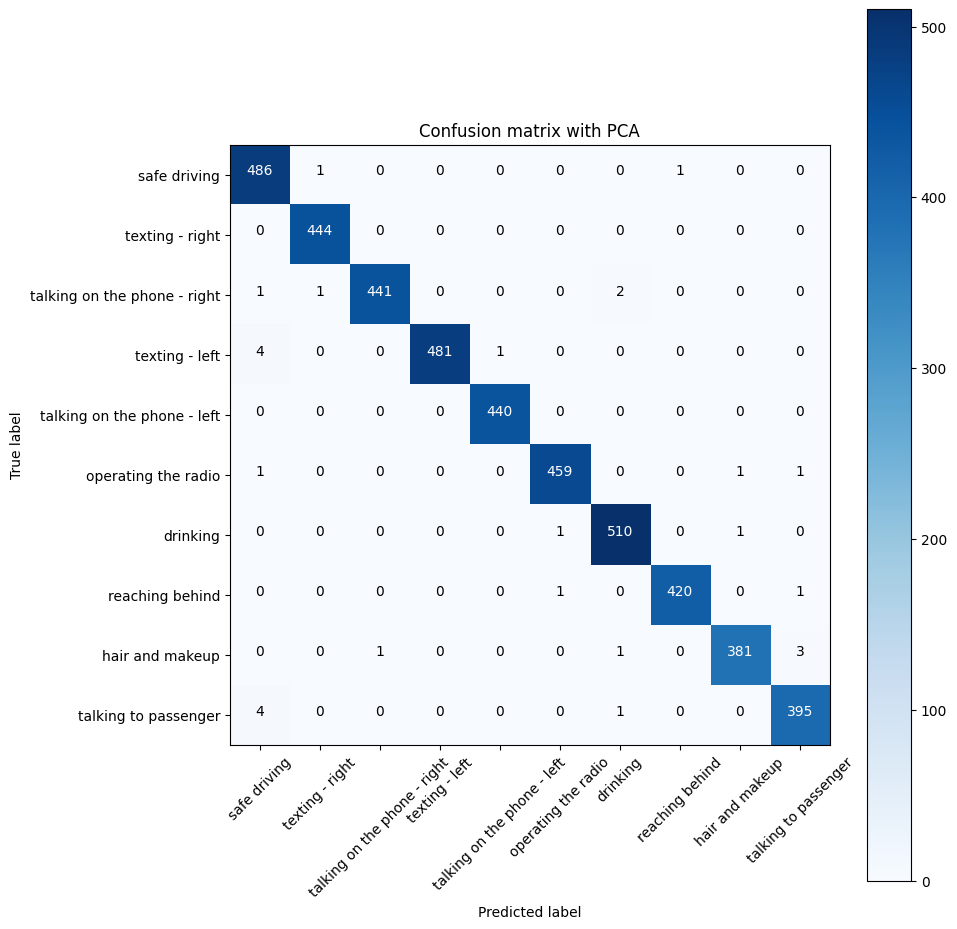

In [26]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix with PCA')

Confusion matrix


<Figure size 640x480 with 0 Axes>

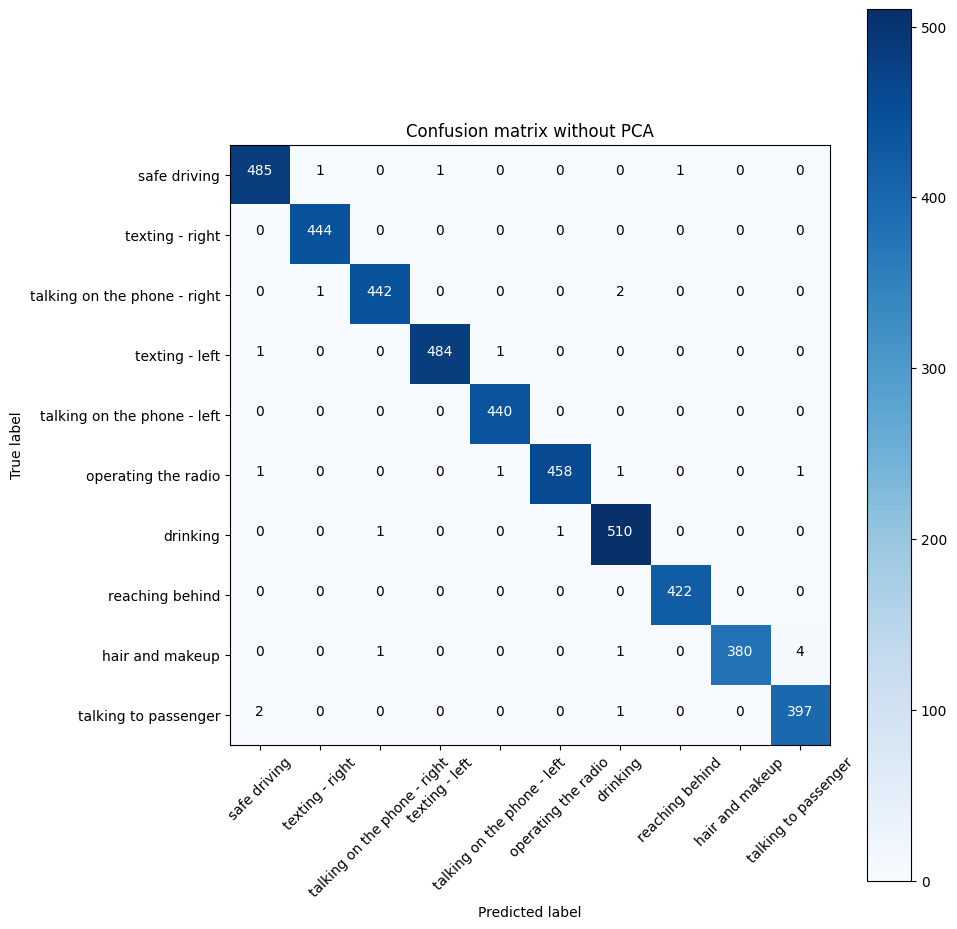

In [27]:
from sklearn.metrics import confusion_matrix
# Compute confusion matrix
cnf_matrix = confusion_matrix(test_labels, predictions_no_pca)
np.set_printoptions(precision=2)

# Plot non-normalized confusion matrix
plt.figure()
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']

plot_confusion_matrix(cnf_matrix, classes=class_names,
                      title='Confusion matrix without PCA')

In [28]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.98      1.00      0.99       488
             texting - right       1.00      1.00      1.00       444
talking on the phone - right       1.00      0.99      0.99       445
              texting - left       1.00      0.99      0.99       486
 talking on the phone - left       1.00      1.00      1.00       440
         operating the radio       1.00      0.99      0.99       462
                    drinking       0.99      1.00      0.99       512
             reaching behind       1.00      1.00      1.00       422
             hair and makeup       0.99      0.99      0.99       386
        talking to passenger       0.99      0.99      0.99       400

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [29]:
#classification report
from sklearn.metrics import confusion_matrix, classification_report
y_true = test_labels
class_names = ['safe driving', 'texting - right', 'talking on the phone - right', 'texting - left', 'talking on the phone - left', 'operating the radio', 'drinking', 'reaching behind',
               'hair and makeup', 'talking to passenger']
print(classification_report(y_true, predictions_no_pca, target_names = class_names))

                              precision    recall  f1-score   support

                safe driving       0.99      0.99      0.99       488
             texting - right       1.00      1.00      1.00       444
talking on the phone - right       1.00      0.99      0.99       445
              texting - left       1.00      1.00      1.00       486
 talking on the phone - left       1.00      1.00      1.00       440
         operating the radio       1.00      0.99      0.99       462
                    drinking       0.99      1.00      0.99       512
             reaching behind       1.00      1.00      1.00       422
             hair and makeup       1.00      0.98      0.99       386
        talking to passenger       0.99      0.99      0.99       400

                    accuracy                           0.99      4485
                   macro avg       0.99      0.99      0.99      4485
                weighted avg       0.99      0.99      0.99      4485



In [30]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions)

0.9964539413346062

In [31]:
#AUC
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_auc_score
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return roc_auc_score(y_test, y_pred, average=average)

y_true = test_labels
multiclass_roc_auc_score(y_true, predictions_no_pca)

0.9970837476528391

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 289ms/step


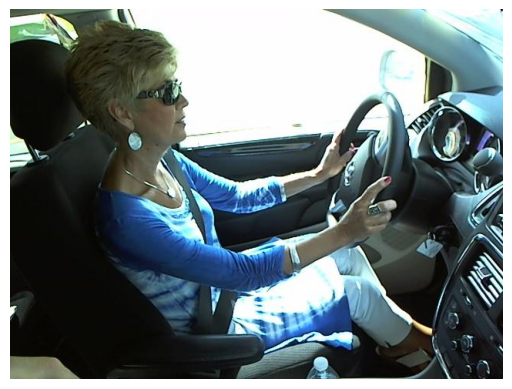

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_29357.jpg
Predicted Class: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


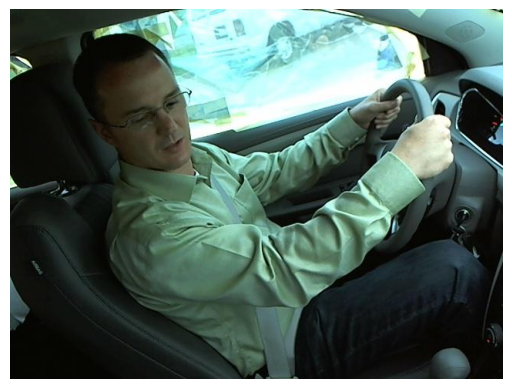

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_2843.jpg
Predicted Class: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


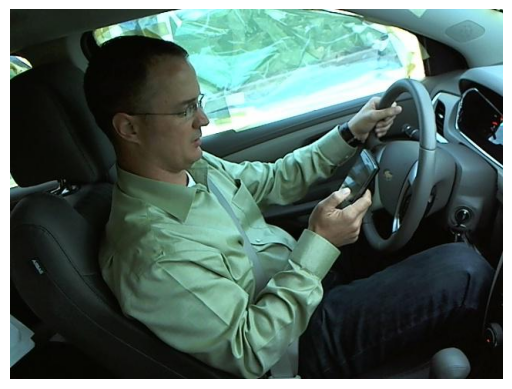

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_62972.jpg
Predicted Class: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


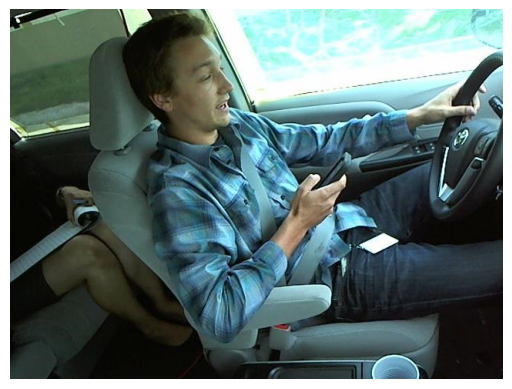

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_31692.jpg
Predicted Class: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


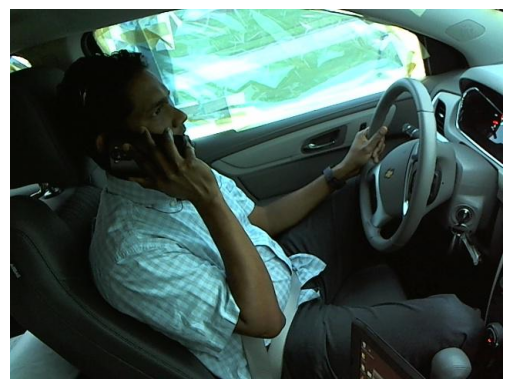

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_92802.jpg
Predicted Class: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


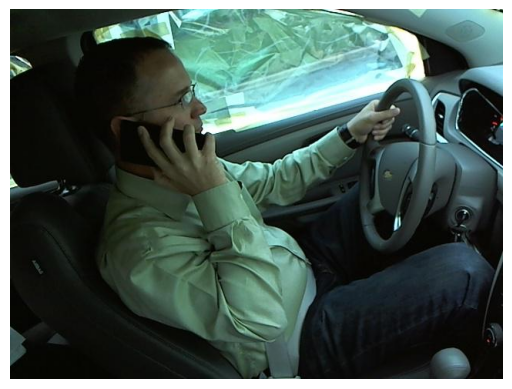

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_33222.jpg
Predicted Class: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


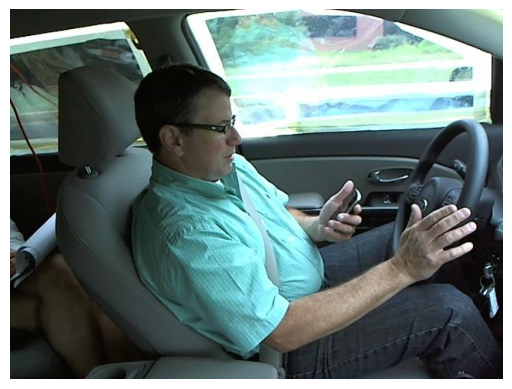

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_53574.jpg
Predicted Class: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


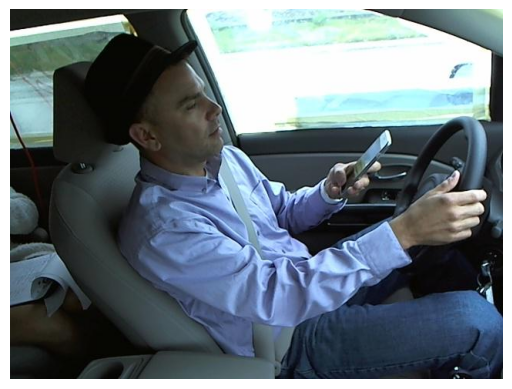

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_37915.jpg
Predicted Class: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


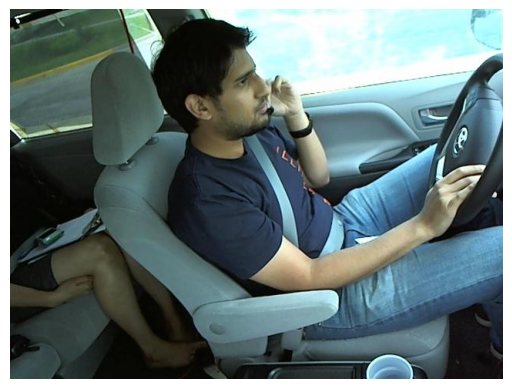

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_25187.jpg
Predicted Class: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


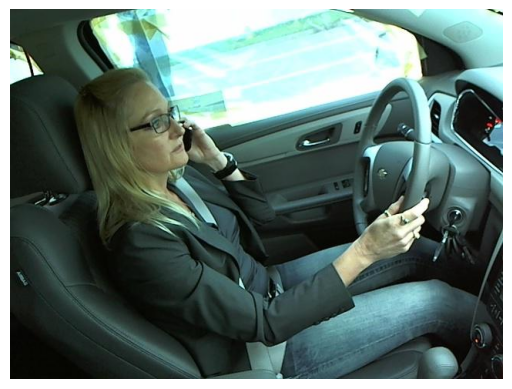

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_55626.jpg
Predicted Class: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


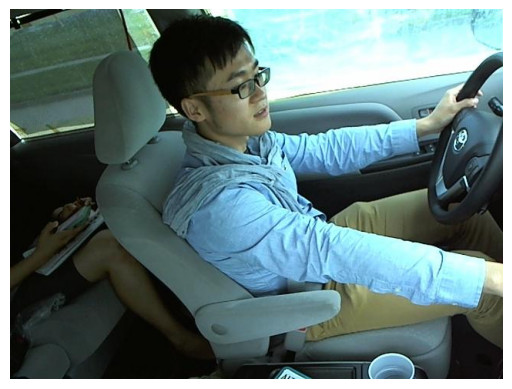

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_79555.jpg
Predicted Class: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


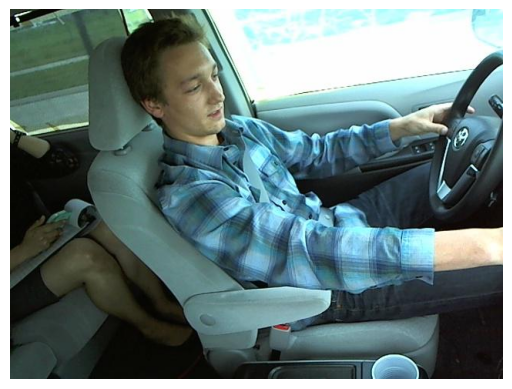

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_97039.jpg
Predicted Class: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


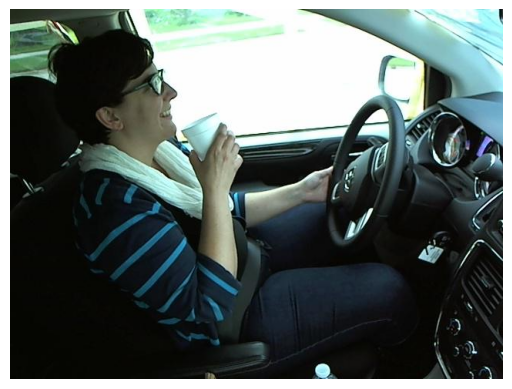

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_90690.jpg
Predicted Class: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


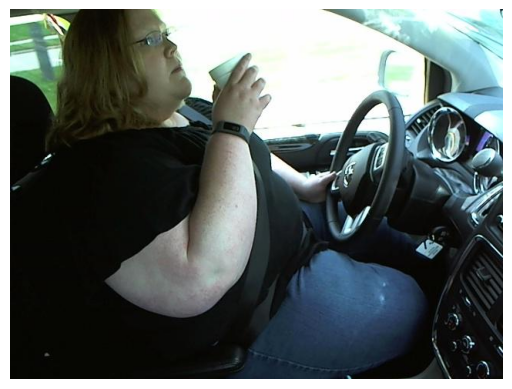

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_21889.jpg
Predicted Class: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


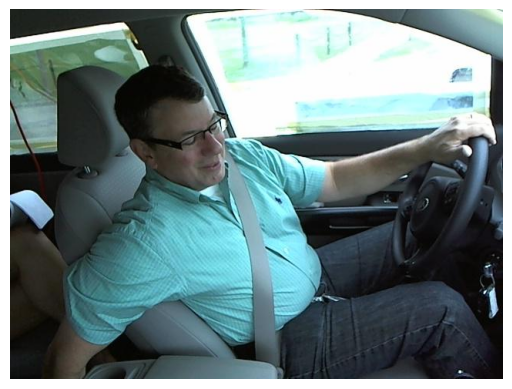

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_94903.jpg
Predicted Class: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


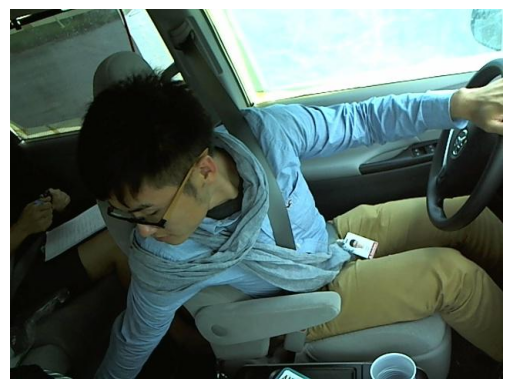

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_59800.jpg
Predicted Class: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


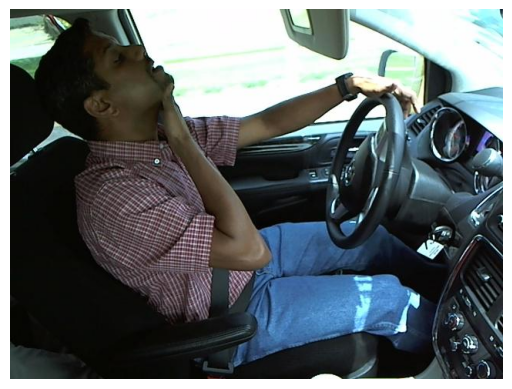

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_82894.jpg
Predicted Class: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


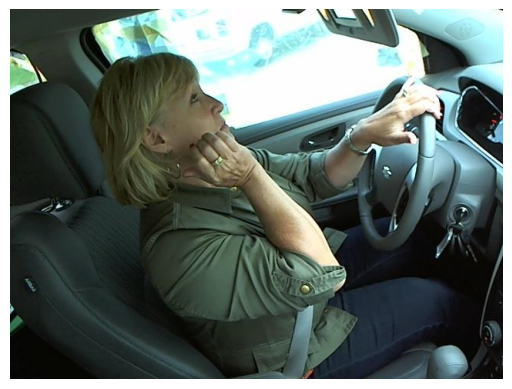

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_28664.jpg
Predicted Class: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


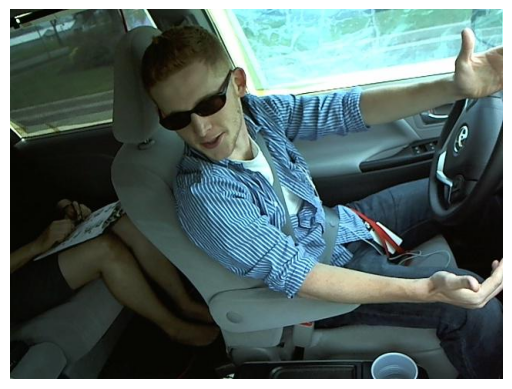

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_42312.jpg
Predicted Class: talking to passenger

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


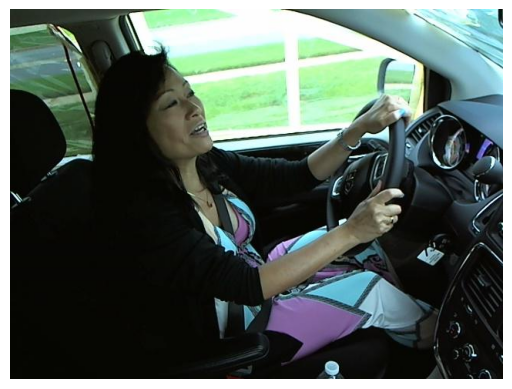

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_66799.jpg
Predicted Class: talking to passenger



In [32]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'/kaggle/input/state-farm-distracted-driver-detection/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        images = pca.transform(images)
        result = svm.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class: {class_names[result[0]]}")
        print()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


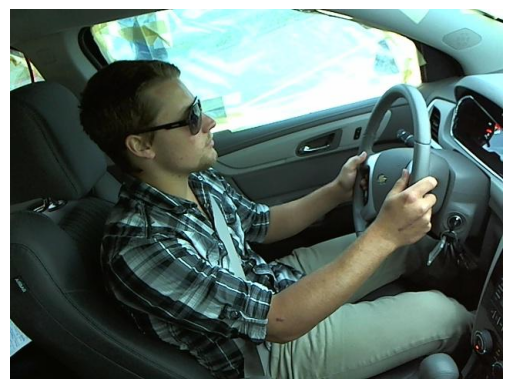

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_21618.jpg
Predicted Class without PCA: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


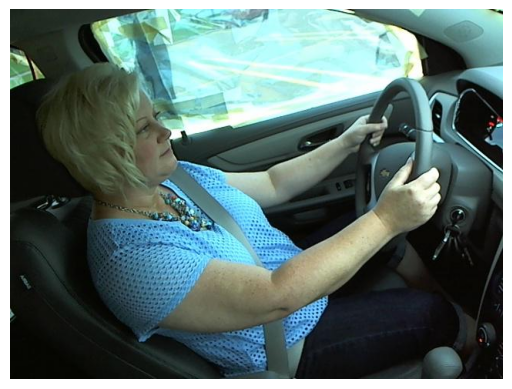

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c0/img_100145.jpg
Predicted Class without PCA: safe driving

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


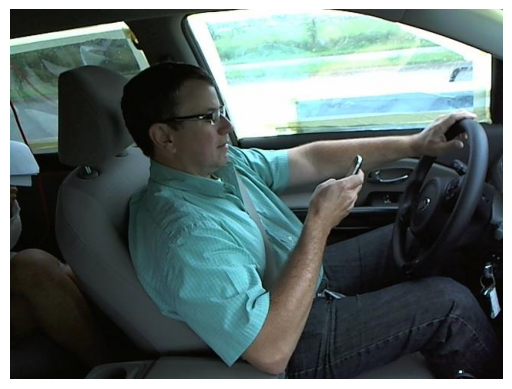

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_34061.jpg
Predicted Class without PCA: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


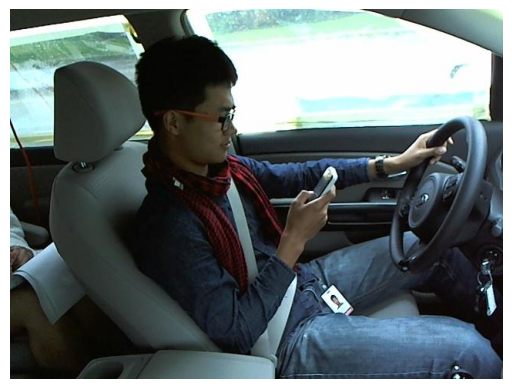

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c1/img_53306.jpg
Predicted Class without PCA: texting - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


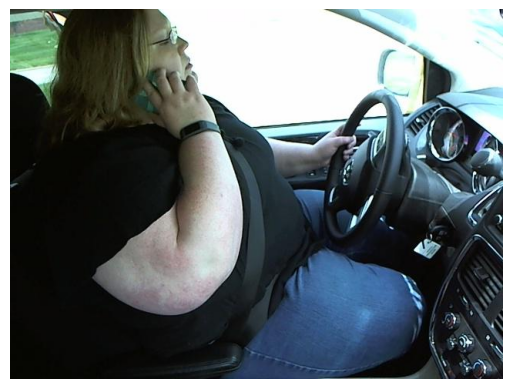

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_81515.jpg
Predicted Class without PCA: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


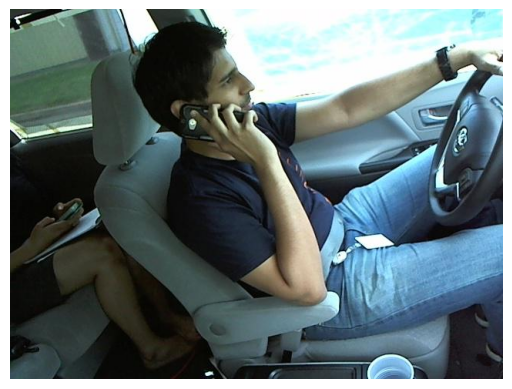

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c2/img_72914.jpg
Predicted Class without PCA: talking on the phone - right

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


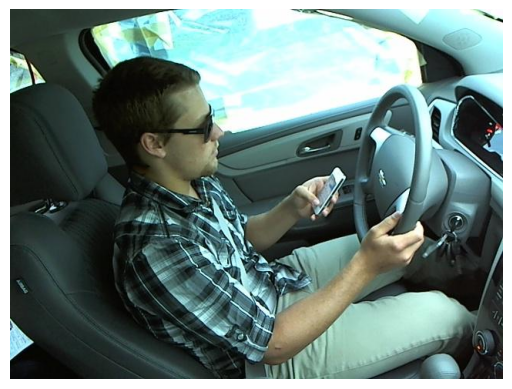

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_35808.jpg
Predicted Class without PCA: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


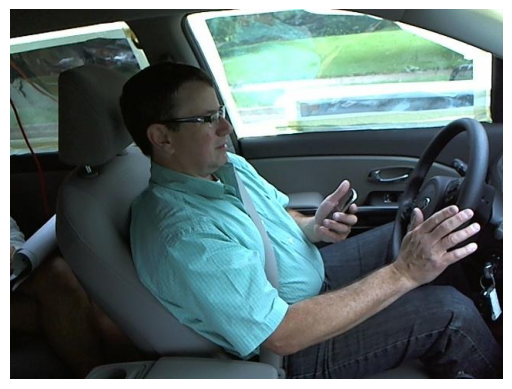

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c3/img_38933.jpg
Predicted Class without PCA: texting - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


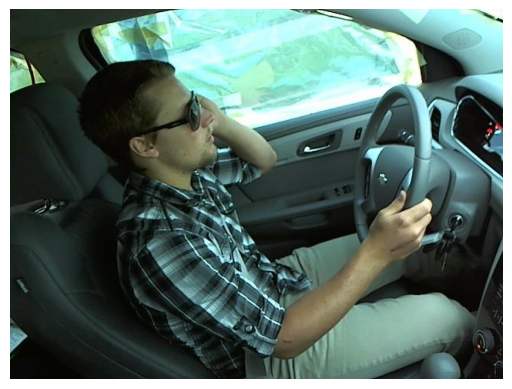

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_60376.jpg
Predicted Class without PCA: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


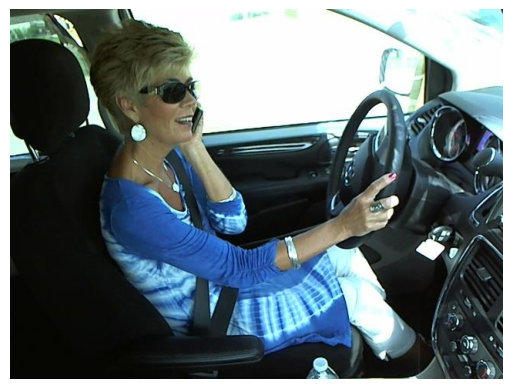

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c4/img_60290.jpg
Predicted Class without PCA: talking on the phone - left

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


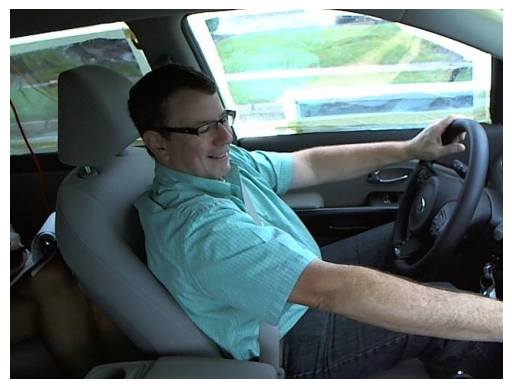

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_35061.jpg
Predicted Class without PCA: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


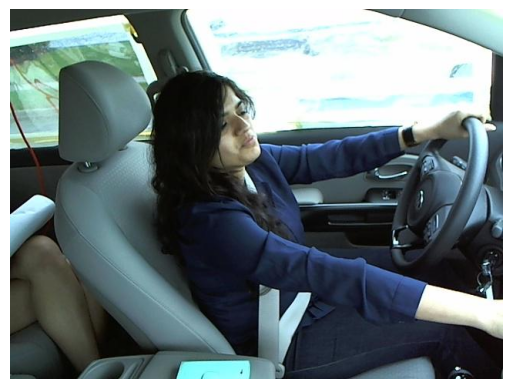

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c5/img_32167.jpg
Predicted Class without PCA: operating the radio

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


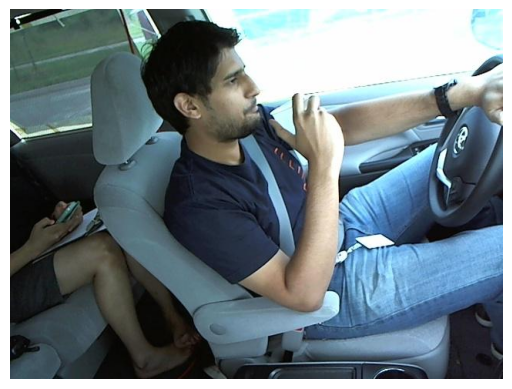

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_102056.jpg
Predicted Class without PCA: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


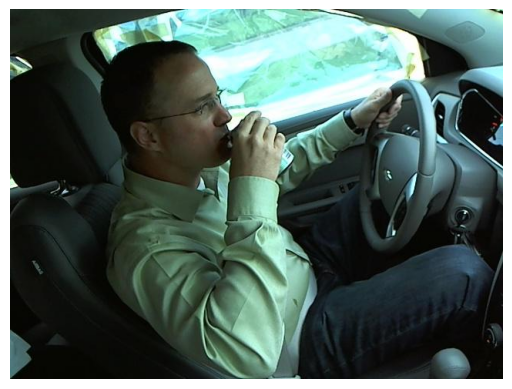

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c6/img_74953.jpg
Predicted Class without PCA: drinking

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


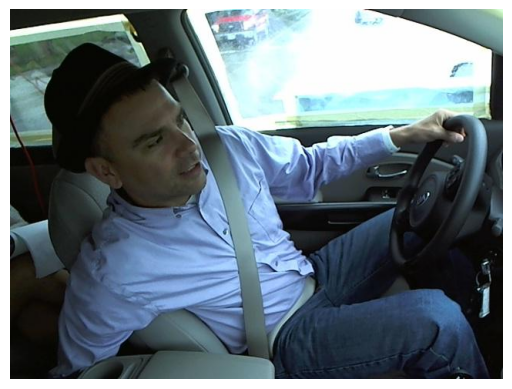

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_70134.jpg
Predicted Class without PCA: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


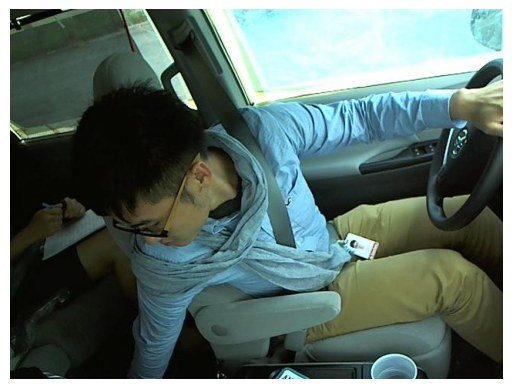

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c7/img_82788.jpg
Predicted Class without PCA: reaching behind

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


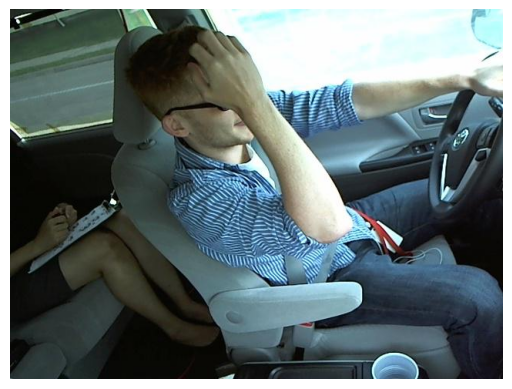

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_47890.jpg
Predicted Class without PCA: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step


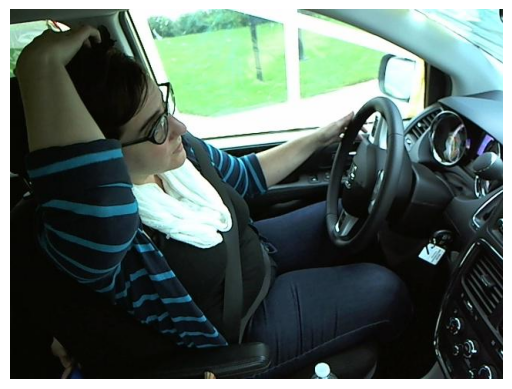

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c8/img_11103.jpg
Predicted Class without PCA: hair and makeup

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


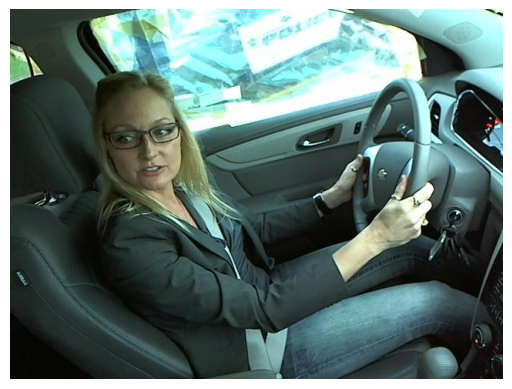

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_88739.jpg
Predicted Class without PCA: talking to passenger

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


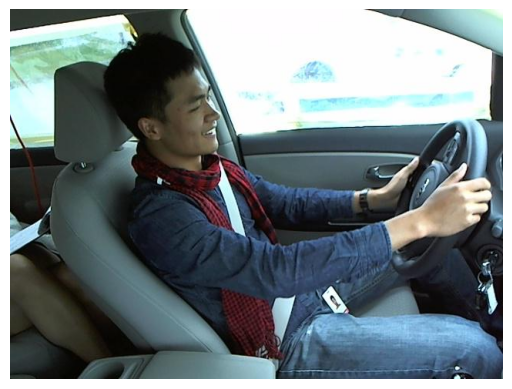

Image: /kaggle/input/state-farm-distracted-driver-detection/imgs/train/c9/img_53672.jpg
Predicted Class without PCA: talking to passenger



In [33]:
# Define the class names
class_names_folder = ['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9']

# Number of images to display from each class
num_images_per_class = 2

# Loop through each class
for class_index in range(len(class_names_folder)):
    class_label = class_names_folder[class_index]

    # Get all image file paths in the current class folder
    image_paths = glob.glob(f'/kaggle/input/state-farm-distracted-driver-detection/imgs/train/{class_label}/*.jpg')

    # Randomly select the specified number of images from the current class
    selected_image_paths = np.random.choice(image_paths, size=num_images_per_class, replace=False)

    # Loop through the selected images in the current class
    for image_path in selected_image_paths:
        # Load and preprocess the image
        img = cv2.imread(image_path)
        img_resized = cv2.resize(img, (100, 100))/256
        images = np.array([img_resized])

        # Perform prediction
        images = cnn.predict(images)
        result = svm_no_pca.predict(images)

        # Display the original image
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()

        # Print the result
        print(f"Image: {image_path}")
        print(f"Predicted Class without PCA: {class_names[result[0]]}")
        print()

In [34]:
# # Directory path of test images
# test_dir = '/kaggle/input/state-farm-distracted-driver-detection/imgs/test/'

# # Get the list of files in the test directory
# file_list = os.listdir(test_dir)[:20]

# # Process each image and make predictions
# for file_name in file_list:
#     # Load and preprocess the image
#     img_path = os.path.join(test_dir, file_name)
#     img = cv2.imread(img_path)
#     img_c0 = cv2.resize(img, (100, 100)) / 256
#     images = np.array([img_c0])

#     # Perform prediction
#     images = cnn.predict(images)
#     images = pca.transform(images)
#     result = svm.predict(images)

#     # Convert result to class names
#     class_result = class_names[result[0]]

#     # Display the original image
#     plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#     plt.axis('off')
#     plt.title(f"Prediction: {class_result}")
#     plt.show()

In [35]:
with open('svm_manual_bisa_v4.4.pkl', 'wb') as f:
    pickle.dump(svm, f)
with open('svm_manual_bisa_v4.4_no_pca.pkl', 'wb') as f:
    pickle.dump(svm_no_pca, f)
with open('pca_manual_bisa_v4.4.pkl', 'wb') as f:
    pickle.dump(pca, f)
cnn.save('/kaggle/working/cnn_bisa_v4.4.h5')